**OVERVIEW**

In this application, you will explore a dataset from Kaggle. The original dataset contained information on 3 million used cars. The provided dataset contains information on 426K cars to ensure speed of processing.  Your goal is to understand what factors make a car more or less expensive.  As a result of your analysis, you should provide clear recommendations to your client -- a used car dealership -- as to what consumers value in a used car.

### CRISP-DM Framework

<center>
    <img src = images/crisp.png width = 50%/>
</center>


To frame the task, throughout our practical applications, we will refer back to a standard process in industry for data projects called CRISP-DM.  This process provides a framework for working through a data problem.  Your first step in this application will be to read through a brief overview of CRISP-DM [here](https://mo-pcco.s3.us-east-1.amazonaws.com/BH-PCMLAI/module_11/readings_starter.zip).  After reading the overview, answer the questions below.

### Business Understanding

From a business perspective, we are tasked with identifying key drivers for used car prices.  In the CRISP-DM overview, we are asked to convert this business framing to a data problem definition.  Using a few sentences, reframe the task as a data task with the appropriate technical vocabulary. 

#The goal of this analysis is to detect and measure the impact of several factors (make, model, year, mileage, condition, location, and extra features) on a car's pricing using statistical and machine-learning techniques

#Regression analysis reframes the task as forecasting the price of a used car based on its qualities.


#A predictive model determines which aspects are most important in deciding a used car's pricing, giving the dealership practical insights into what features used car buyers value most.



#This helps dealerships optimize pricing strategies to maximize profitability and sales.


### Data Understanding

After considering the business understanding, we want to get familiar with our data.  Write down some steps that you would take to get to know the dataset and identify any quality issues within.  Take time to get to know the dataset and explore what information it contains and how this could be used to inform your business understanding.

Initial Exploration:
Load the data: Read the "vehicles.csv" file into a Pandas DataFrame.
Display the first few rows: Use df.head() to get a quick overview of the data structure, column names, and example values.
Check data dimensions: Use df.shape to understand the number of rows and columns.
Get column information: Use df.info() to see column names, data types, and the number of non-null values.

Data Type Analysis:
Review data types: Analyze the output of df.info() to confirm that the data types of each column are appropriate (e.g., numeric columns are stored as int or float, categorical columns are of object type).
Identify potential type issues: Note any columns with incorrect data types that need conversion. For example, a column containing numerical values might be incorrectly inferred as an object type if it contains non-numeric charact

Handling Missing Values:
Calculate missing values: Use df.isnull().sum() to determine the number of missing values in each column.
Assess missing value impact: Consider the impact of missing values on subsequent analysis. For example, a high percentage of missing values in a crucial column might necessitate imputation or exclusion of that column.
Understand the importance of certain features which can help create determinations as to how these features can be used in our model to provide accurate results

Exploring Categorical Variables:
Check unique values: For categorical columns, use df['column_name'].unique() or df['column_name'].value_counts() to examine the distinct values and their frequencies.
Identify inconsistencies: Look for inconsistencies in categorical data, such as different spellings or abbreviations for the same category (e.g., "Toyota" vs. "TOYOTA," "sedan" vs. "Sedan")
Understand the import of specific features which can help determine how these can be used model to provide accurate results. 

Analyzing Numerical Variables:
Descriptive statistics: Use df.describe() to get summary statistics for numerical columns, including mean, standard deviation, minimum, maximum, and quartiles.
Identify outliers: Use visualizations like histograms, box plots, or scatter plots to identify potential outliers, which could indicate data entry errors or unusual observations.
Check for unrealistic values: Look for values that don't make sense in the context of the data (e.g., a negative price or an extremely high mileage).

In [ ]:
import numpy as np
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt 
from sklearn.preprocessing import OneHotEncoder,PolynomialFeatures,StandardScaler
from sklearn.compose import ColumnTransformer,make_column_transformer,make_column_selector
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.linear_model import LinearRegression,Ridge, Lasso
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from category_encoders import TargetEncoder
from sklearn.feature_selection import SequentialFeatureSelector
from sklearn.inspection import permutation_importance
import re
import warnings 
warnings.filterwarnings('ignore')
import plotly.express as px
from ydata_profiling import ProfileReport

In [6]:
df = pd.read_csv('data/vehicles.csv')

In [3]:
df.head()

,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,state
0,7222695916,prescott,6000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,az
1,7218891961,fayetteville,11900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ar
2,7221797935,florida keys,21000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,fl
3,7222270760,worcester / central MA,1500,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ma
4,7210384030,greensboro,4900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,nc


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 426880 entries, 0 to 426879
Data columns (total 18 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   id            426880 non-null  int64  
 1   region        426880 non-null  object 
 2   price         426880 non-null  int64  
 3   year          425675 non-null  float64
 4   manufacturer  409234 non-null  object 
 5   model         421603 non-null  object 
 6   condition     252776 non-null  object 
 7   cylinders     249202 non-null  object 
 8   fuel          423867 non-null  object 
 9   odometer      422480 non-null  float64
 10  title_status  418638 non-null  object 
 11  transmission  424324 non-null  object 
 12  VIN           265838 non-null  object 
 13  drive         296313 non-null  object 
 14  size          120519 non-null  object 
 15  type          334022 non-null  object 
 16  paint_color   296677 non-null  object 
 17  state         426880 non-null  object 
dtypes: f

In [5]:
df.shape

(426880, 18)

In [6]:

# 2) Using a tool to generate a complete report over the data
profile = ProfileReport(df)
profile.to_file(output_file='data/vehicles_eda_report.html')


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 18/18 [00:05<00:00,  3.47it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [7]:
# 2.1) Generate the report
profile

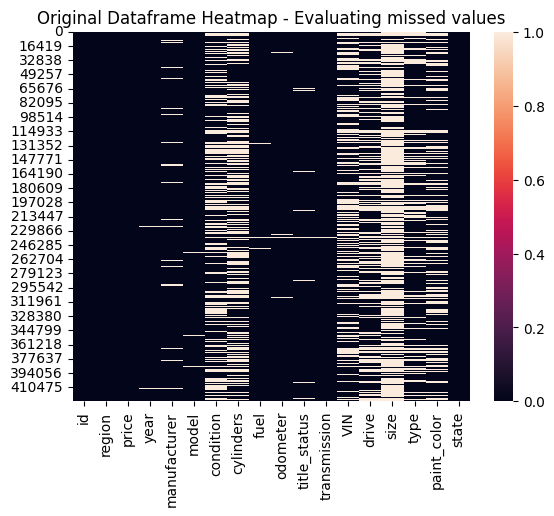

In [3]:
ax= sns.heatmap(df.isna())
ax.set_title("Original Dataframe Heatmap - Evaluating missed values")
plt.show()

# Column Analysis and Actions for EAD Report Data

-   **id:** This is a unique value.
    -   Action: Delete this column as it can’t be useful for the regression analysis.
-   **region:** Name of the region where the transaction was reported. 0% of missed records.
    -   Action: None.
-   **Price:** Sales Price of the car. 7.7% of the records are with zero.
    -   Action: Remove records with zero values as this is necessary for the prediction.
-   **Year:** Year missing records are 0.3%.
    -   Action: Populate the missing values from VIN or most common values.
-   **Manufacturer:** The car year missing records are 4.1%.
    -   Action: Populate the missing values from VIN or populate with others.
-   **Model:** The car model missing records are 7.0%.
    -   Action: Populate the missing values from VIN or populate with others.
-   **condition:** Status of car when sold. Missed records 40.8%.
    -   Action: Filling with the most common value.
-   **cylinders:** Missed records 41.6%.
    -   Action: Remove the word "cylinders," Replace others and missed values by filling with the most common value.
-   **fuel:** Missed records 0.7%.
    -   Action: Filling with "Other" as this is a categorical column.
-   **odometer:** Odometer when sold vehicle. 1% missed.
    -   Action: Filling with odometer mean.
-   **title\_status:** This represents the status of the title of car. 1.9% missed.
    -   Action: Filling with the most common value.
-   **transmission:** Missed records 0.6%.
    -   Action: Filling with "Other" as this is a categorical column.
-   **VIN:** Must be an unique value by car. Missed 37.7%.
    -   Action: Remove column as we can't use into regressions.
-   **drive:** Missed records 30.6%.
    -   Action: Filling with "Other" as this is a categorical column.
-   **size:** Classification for size of vehicle. There are 71.8% of records missed.
    -   Action: Filling with "Other" as this is a categorical column.
-   **type:** Missed records 21.8%.
    -   Action: Filling with "Other" as this is a categorical column.
-   **paint\_color:** Missed records 30.5%.
    -   Action: Filling with "Other" as this is a categorical column, replace "7" with "other."
-   **state:** Administrative area - State.
    -   Action: None.

### Data Preparation

After our initial exploration and fine-tuning of the business understanding, it is time to construct our final dataset prior to modeling.  Here, we want to make sure to handle any integrity issues and cleaning, the engineering of new features, any transformations that we believe should happen (scaling, logarithms, normalization, etc.), and general preparation for modeling with `sklearn`. 

In [15]:
#Remove records with Price as Zero 

df_prep = df.query('price > 0')

#Dropping id, VIN are unique values and can't be used in the regression
#Dropping region as it can be derived from the state
df_prep=df_prep.drop(['id','VIN','region','size','paint_color','drive'],axis=1)
# Fill the missing values 
df_prep["year"]= df_prep["year"].fillna(df_prep["year"].mode()[0])
df_prep["year"]= df_prep['year'].apply(lambda x: int(x))
df_prep["manufacturer"]=df_prep["manufacturer"].fillna('other')
df_prep["model"]=df_prep["model"].fillna('other')
df_prep["condition"]=df_prep["condition"].fillna(df_prep["condition"].mode()[0])
df_prep["cylinders"]=df_prep["cylinders"].str.replace(' cylinders','')
df_prep["cylinders"]=df_prep["cylinders"].fillna(df_prep["cylinders"].mode()[0])
df_prep["cylinders"]=df_prep["cylinders"].str.replace('other',df_prep["cylinders"].mode()[0])
df_prep["cylinders"]=pd.to_numeric(df_prep["cylinders"])
df_prep["fuel"]=df_prep["fuel"].fillna('other')
df_prep["odometer"]=df_prep["odometer"].fillna(df_prep["odometer"].mean())
df_prep["title_status"]=df_prep["title_status"].fillna(df_prep["title_status"].mode()[0])
df_prep["transmission"]=df_prep["transmission"].fillna('other')
# df_prep["drive"] = df_prep["drive"].fillna('other')
# df_prep["size"] = df_prep["size"].fillna('other')
df_prep["type"] = df_prep["type"].fillna('other')
# df_prep["paint_color"] = df_prep["paint_color"].fillna('other')
# df_prep["paint_color"] = df_prep["paint_color"].str.replace('7', 'other')

# Function used to extract the first word of the model
def first_words(item):
    model = item["model"]
    segments = re.split(r"[, \!?:]+", model)
    index = 0
    value = segments[index]

    # If the model is compound with the manufacturer name
    if(value == item["manufacturer"]): 
        index += 1 
        if(len(segments) > index):
            value = segments[index]   

    return value.title() 

df_prep['model']=df_prep['model'].str.replace('-','')
df_prep['model']=df_prep.apply(first_words,axis=1)
#Removing the inaccurate records which says the auto transmission started in 1948
df_prep = df_prep.query('not (year < 1948 and transmission=="automatic")')



In [10]:
# 2) Using a tool to generate a complete report over the data
profile_clean = ProfileReport(df_prep)
profile_clean.to_file(output_file='data/vehicle_eda_data_cleaned.html')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 12/12 [00:00<00:00, 23.67it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
#Generate the report
#profile_clean

In [16]:
df_prep.sample(10)

,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,type,state
390298,9590,2010,kia,Forte,good,6,gas,85615.0,clean,other,sedan,va
100815,2600,2006,nissan,Altima,good,4,gas,150000.0,rebuilt,automatic,sedan,fl
183439,22995,2012,mercedes-benz,S,good,8,gas,91265.0,clean,automatic,sedan,md
418746,2999,2007,toyota,Yaris,like new,4,gas,146764.0,clean,automatic,sedan,wi
103742,25590,2017,acura,Rdx,good,6,gas,33671.0,clean,automatic,SUV,fl
377353,5900,2004,toyota,Sequoia,excellent,8,gas,201720.0,clean,automatic,SUV,tx
108214,12995,1990,gmc,Topkick,good,6,gas,41000.0,clean,manual,other,fl
397857,12999,2010,mazda,Miata,good,4,gas,140237.0,clean,manual,convertible,va
37163,21999,2013,dodge,Challenger,good,6,gas,58580.0,clean,manual,other,ca
77558,22590,2012,chevrolet,Silverado,good,6,other,99554.0,clean,other,pickup,co


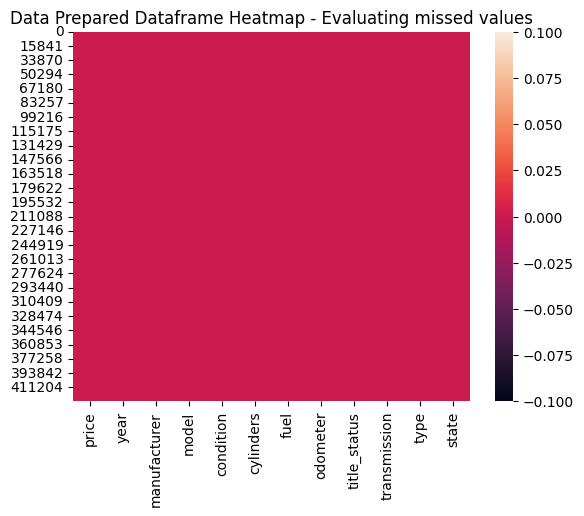

In [17]:
# Re-evaluating missed values using heatmap
ax = sns.heatmap(
	df_prep.isna()
)
ax.set_title("Data Prepared Dataframe Heatmap - Evaluating missed values")
plt.show()

#### Identifying Outliers for Price column

We can use the IQR to determine boundaries for outliers.  One such rule of thumb is that any values $1.5 \times IQR$ above the third quartile or below the first are considered outliers.  

Calculate the lower and upper boundaries for outliers for the `price` column using the IQR rule.

In [26]:
# Function to detect Outliers and return the DF filtered
def outliers_filter(df_prep, column):
    factor = 1.5
    first_quartile = df_prep[column].quantile(.25)
    third_quartile = df_prep[column].quantile(.75)
    iqr = third_quartile - first_quartile
    lower = first_quartile - factor*iqr
    upper = third_quartile + factor*iqr
    print( f' lower: { lower }, upper: { upper }')
    return

outliers_filter(df_prep, 'price')

# Redefine outliers using approximated values based on suggested results
lower = 100
upper = 70000
df_wo_outliers = df_prep.query( f'price > { lower } and price < { upper }' )

 lower: -23885.0, upper: 58475.0


[Text(0.5, 1.0, 'Price Distribution without outliers')]

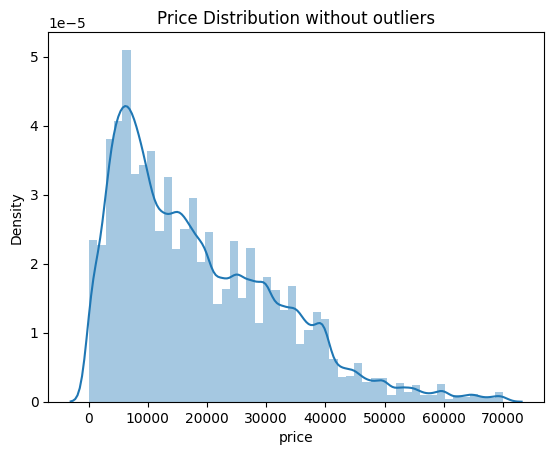

In [27]:
# Visualization of price distributions without outliers
sns.distplot(
    df_wo_outliers['price']
).set(title = "Price Distribution without outliers")

### Modeling

With your (almost?) final dataset in hand, it is now time to build some models.  Here, you should build a number of different regression models with the price as the target.  In building your models, you should explore different parameters and be sure to cross-validate your findings.

#### Build train and test set

In [28]:
# Defining the results Array to capture the different regression results 
results = []
# Splitting the dataset into Train and Test
X = df_wo_outliers.drop('price', axis = 1)
y = df_wo_outliers['price']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 42)

#  excluding (price) which is objective to predict 
features = X.columns

# Get categorical columns
cat_columns = df_wo_outliers.select_dtypes(include='object').columns
cat_columns


Index(['manufacturer', 'model', 'condition', 'fuel', 'title_status',
       'transmission', 'type', 'state'],
      dtype='object')

In [29]:
#Encoding columns to apply regression 
target_encoder =TargetEncoder()
df_target_encoded=target_encoder.fit_transform(df_wo_outliers[features],df_wo_outliers["price"])
X1=df_target_encoded
y1=df_wo_outliers["price"]
X1_train, X1_test, y1_train, y1_test = train_test_split(X1,y1,test_size=0.3,random_state=42)

#Train the model with LinearRegression 
linearreg_model = LinearRegression().fit(X1_train, y1_train)

# Price Predictions from the train and test data set 
pred_train = linearreg_model.predict(X1_train[features])
pred_test = linearreg_model.predict(X1_test[features])

#Obtaining errors for training and test datasets 
train_mse =mean_squared_error(y1_train,pred_train)
test_mse =mean_squared_error(y1_test,pred_test)

train_r2 = r2_score(y_train, pred_train)
test_r2 = r2_score(y_test, pred_test)

#collection results 
Linreg_results={
    'model': 'simpleRegression',
    'train_mse': train_mse,
    'test_mse':test_mse,
    'train_r2':train_r2,
    'test_r2': test_r2
}
results.append(Linreg_results)



In [30]:
results

[{'model': 'simpleRegression',
  'train_mse': 88735459.89953302,
  'test_mse': 88078978.3810085,
  'train_r2': 0.5228834334168833,
  'test_r2': 0.5250895561410707}]

#### Perform a Linear Regression with Polynomial Features

In [31]:
#Using grid search, including the target encoder and polynomial features
column_transformer = make_column_transformer(
    (TargetEncoder(), cat_columns),
    (PolynomialFeatures(degree=2, include_bias=False), make_column_selector(dtype_include=np.number)),
    remainder='passthrough' # Keep other columns (if any) unchanged
)
#Defining a pipeline for the columns transformations, scaling data, and performing LinearRegression
pipe = Pipeline([
    ('transformer',column_transformer),
    ('scaler',StandardScaler()),
    ('linreg',LinearRegression())
])
#Different degrees to use over on the PolynomialFeatures function 
param_dict = {
    'transformer__polynomialfeatures__degree':[1,2,3,4,5]
}
grscv_linreg= GridSearchCV(
    pipe,
    param_grid=param_dict                    
)
#Train the model 
grscv_linreg.fit(X_train[features],y_train)

GridSearchCV(estimator=Pipeline(steps=[('transformer',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('targetencoder',
                                                                         TargetEncoder(),
                                                                         Index(['manufacturer', 'model', 'condition', 'fuel', 'title_status',
       'transmission', 'type', 'state'],
      dtype='object')),
                                                                        ('polynomialfeatures',
                                                                         PolynomialFeatures(include_bias=False),
                                                                         <sklearn.compose._column_transformer.make_column_selector object at 0x310e9fd70>)])),
                                       ('scaler', StandardScaler()),
                                       ('linreg', LinearRegression())]),
             param_grid={'transformer__polynomialfeatures__degree': [1, 2, 3, 4,
                                                                     5]})

In [32]:
# Obtaining predictions
pred_train = grscv_linreg.best_estimator_.predict(X_train[features])
pred_test = grscv_linreg.best_estimator_.predict(X_test[features])

# Evaluating the errors
train_mse = mean_squared_error(y1_train, pred_train)
test_mse = mean_squared_error(y1_test, pred_test)

train_r2 = r2_score(y1_train, pred_train)
test_r2 = r2_score(y1_test, pred_test)

# Reporting results for this regression model
grscv_results = {
    'model': 'linearRegressionWithPF',
    'train_mse': train_mse,
    'test_mse': test_mse,
    'train_r2': train_r2,
    'test_r2': test_r2
}
results.append(grscv_results)

In [33]:
#### Ridge Regression with Polynomial Features

In [34]:
#Using grid search, including the target encoder and polynomial features
column_transformer = make_column_transformer(
    (TargetEncoder(), cat_columns),
    (PolynomialFeatures(), make_column_selector(dtype_include=np.number)),
    remainder='passthrough' # Keep other columns (if any) unchanged
)
#Defining a pipeline for the columns transformations, scaling data, and performing LinearRegression
pipe = Pipeline([
    ('transformer',column_transformer),
    ('scaler',StandardScaler()),
    ('ridge',Ridge())
])
#Different degrees to use over on the PolynomialFeatures function 
param_dict = {
    'transformer__polynomialfeatures__degree':[1,2,3,4,5],
    'ridge__alpha': np.logspace(0,5,10)
}
grscv_ridge= GridSearchCV(
    pipe,
    param_grid=param_dict                    
)
#Train the model 
grscv_ridge.fit(X_train[features],y_train)

GridSearchCV(estimator=Pipeline(steps=[('transformer',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('targetencoder',
                                                                         TargetEncoder(),
                                                                         Index(['manufacturer', 'model', 'condition', 'fuel', 'title_status',
       'transmission', 'type', 'state'],
      dtype='object')),
                                                                        ('polynomialfeatures',
                                                                         PolynomialFeatures(),
                                                                         <sklearn.compose._column_transformer.make_column_selector object at 0x307b84d10>)])),
                                       ('scaler', StandardScaler()),
                                       ('ridge', Ridge())]),
             param_grid={'ridge__alpha': array([1.00000000e+00, 3.59381366e+00, 1.29154967e+01, 4.64158883e+01,
       1.66810054e+02, 5.99484250e+02, 2.15443469e+03, 7.74263683e+03,
       2.78255940e+04, 1.00000000e+05]),
                         'transformer__polynomialfeatures__degree': [1, 2, 3, 4,
                                                                     5]})

In [35]:
# Obtaining predictions
pred_train = grscv_ridge.best_estimator_.predict(X_train[features])
pred_test = grscv_ridge.best_estimator_.predict(X_test[features])

# Evaluating error
train_mse = mean_squared_error(y1_train, pred_train)
test_mse = mean_squared_error(y1_test, pred_test)

train_r2 = r2_score(y1_train, pred_train)
test_r2 = r2_score(y1_test, pred_test)

# Reporting results
reg_results = {
    'model': 'ridgeRegressionWithPF',
    'train_mse': train_mse,
    'test_mse': test_mse,
    'train_r2': train_r2,
    'test_r2': test_r2,
    'hyperParams': grscv_ridge.best_params_
}
results.append(reg_results)

#### Lasso Regression with polynomial features

In [36]:
##Using grid search, including the target encoder and polynomial features
column_transformer = make_column_transformer(
    (TargetEncoder(), cat_columns),
    (PolynomialFeatures(), make_column_selector(dtype_include=np.number)),
    remainder='passthrough' # Keep other columns (if any) unchanged
)
#Defining a pipeline for the columns transformations, scaling data, and performing LinearRegression
pipe = Pipeline([
    ('transformer',column_transformer),
    ('scaler',StandardScaler()),
    ('lasso',Lasso(random_state=42))
])
#Different degrees to use over on the PolynomialFeatures function 
param_dict = {
    'transformer__polynomialfeatures__degree':[1,2,3,4,5]
}
grscv_lasso= GridSearchCV(
    pipe,
    param_grid=param_dict                    
)
#Train the model 
grscv_lasso.fit(X_train[features],y_train)

GridSearchCV(estimator=Pipeline(steps=[('transformer',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('targetencoder',
                                                                         TargetEncoder(),
                                                                         Index(['manufacturer', 'model', 'condition', 'fuel', 'title_status',
       'transmission', 'type', 'state'],
      dtype='object')),
                                                                        ('polynomialfeatures',
                                                                         PolynomialFeatures(),
                                                                         <sklearn.compose._column_transformer.make_column_selector object at 0x3102ec350>)])),
                                       ('scaler', StandardScaler()),
                                       ('lasso', Lasso(random_state=42))]),
             param_grid={'transformer__polynomialfeatures__degree': [1, 2, 3, 4,
                                                                     5]})

In [37]:
# Obtaining predictions
pred_train = grscv_lasso.best_estimator_.predict(X_train[features])
pred_test = grscv_lasso.best_estimator_.predict(X_test[features])

# Getting errors
train_mse = mean_squared_error(y_train, pred_train)
test_mse = mean_squared_error(y_test, pred_test)

train_r2 = r2_score(y_train, pred_train)
test_r2 = r2_score(y_test, pred_test)

# Reporting results
reg_results = {
    'model': 'lassoRegressionWithPF',
    'train_mse': train_mse,
    'test_mse': test_mse,
    'train_r2': train_r2,
    'test_r2': test_r2,
    'hyperParams': grscv_lasso.best_params_
}
results.append(reg_results)

#### Linear Regression with Sequential Feature Selector

In [38]:
# Exeucting transformation, preparing data
column_transformer = make_column_transformer(
    (PolynomialFeatures(), make_column_selector(dtype_include='number')),                                 
    (TargetEncoder(), cat_columns),
)

# Pipeline use to apply a Linear regression and SequentialFeatureSelector once data has being transformed
pipe = Pipeline([
    ('transformer', column_transformer), 
    ('selector', SequentialFeatureSelector(LinearRegression())),
    ('model', LinearRegression())
])

# Params to iterate over the selector
param_dict = {'selector__n_features_to_select': [2, 3, 4, 5]}
gscv_sf = GridSearchCV(pipe, param_grid=param_dict)

# Training the model
gscv_sf.fit(X_train, y_train)

GridSearchCV(estimator=Pipeline(steps=[('transformer',
                                        ColumnTransformer(transformers=[('polynomialfeatures',
                                                                         PolynomialFeatures(),
                                                                         <sklearn.compose._column_transformer.make_column_selector object at 0x307b32f30>),
                                                                        ('targetencoder',
                                                                         TargetEncoder(),
                                                                         Index(['manufacturer', 'model', 'condition', 'fuel', 'title_status',
       'transmission', 'type', 'state'],
      dtype='object'))])),
                                       ('selector',
                                        SequentialFeatureSelector(estimator=LinearRegression())),
                                       ('model', LinearRegression())]),
             param_grid={'selector__n_features_to_select': [2, 3, 4, 5]})

In [39]:
# Obtaining predictions
pred_train = gscv_sf.best_estimator_.predict(X_train)
pred_test = gscv_sf.best_estimator_.predict(X_test)

# Calculating errors
train_mse = mean_squared_error(y_train, pred_train)
test_mse = mean_squared_error(y_test, pred_test)

train_r2 = r2_score(y_train, pred_train)
test_r2 = r2_score(y_test, pred_test)

# Reporting results
reg_results = {
    'model': 'linearRegressionWithSFS',
    'train_mse': train_mse,
    'test_mse': test_mse,
    'train_r2': train_r2,
    'test_r2': test_r2,
    'hyperParams': gscv_sf.best_params_
}
results.append(reg_results)

In [40]:
df_results = pd.DataFrame(results)
df_results

,model,train_mse,test_mse,train_r2,test_r2,hyperParams
0,simpleRegression,8.873546e+07,8.807898e+07,0.522883,0.525090,NaN
1,linearRegressionWithPF,5.714957e+07,8.183998e+07,0.692716,0.558729,NaN
2,ridgeRegressionWithPF,6.126151e+07,6.076150e+07,0.670607,0.672382,"{'ridge__alpha': 1.0, 'transformer__polynomial..."
3,lassoRegressionWithPF,6.778317e+07,6.730341e+07,0.635541,0.637109,{'transformer__polynomialfeatures__degree': 5}
4,linearRegressionWithSFS,7.296558e+07,7.271058e+07,0.607676,0.607954,{'selector__n_features_to_select': 5}


In [41]:
data_pred = df_wo_outliers.copy()
features = data_pred.drop(['price'],axis=1)
price =data_pred['price']
data_pred['prediction']= grscv_linreg.best_estimator_.predict(features)
import plotly.graph_objects as go 
fig =go.Figure()
fig.add_trace(
    go.Scatter(
        x=features['year'],
        y=data_pred['price'],
        mode='markers',
        name ='actual'
    )
)
fig.update_layout(font_size=20)

### Evaluation

With some modeling accomplished, we aim to reflect on what we identify as a high-quality model and what we are able to learn from this.  We should review our business objective and explore how well we can provide meaningful insight into drivers of used car prices.  Your goal now is to distill your findings and determine whether the earlier phases need revisitation and adjustment or if you have information of value to bring back to your client.

In [42]:
#### Moodel Comparing results

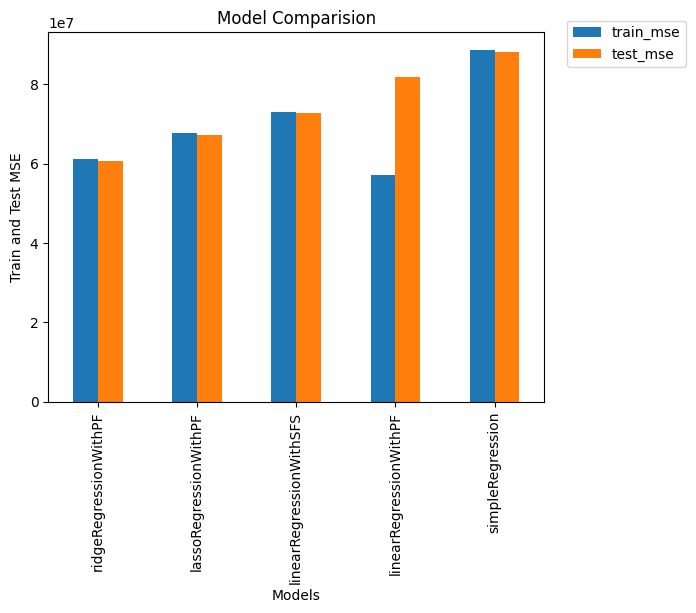

In [43]:
df_results[['model','train_mse','test_mse']].sort_values('test_mse', ascending=True).plot(x='model',kind='bar',stacked=False)
plt.xlabel('Models')
plt.ylabel('Train and Test MSE')
plt.title('Model Comparision')
plt.legend(bbox_to_anchor=(1.3, 1.05))

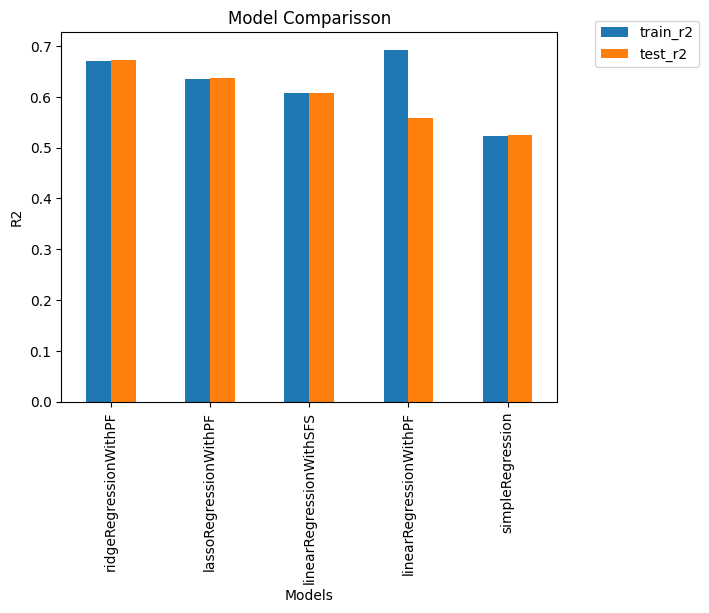

In [44]:
# Comparing final results for train r2 and test r2 by using visualization
df_results = pd.DataFrame(results)
df_results[['model', 'train_r2', 'test_r2']].sort_values('test_r2', ascending=False).plot(x='model', kind='bar', stacked=False)

plt.xlabel("Models")
plt.ylabel("R2")
plt.title('Model Comparisson')
plt.legend(bbox_to_anchor=(1.3, 1.05))

In [45]:
#### Permutation Importance

In [46]:
# Evaluating what are the most important features.
scoring = [ 'neg_mean_squared_error']

# I'm using the best model and the best estimator obtained by this
r_multi = permutation_importance(
            grscv_linreg.best_estimator_, 
            X_test, 
            y_test, 
            n_repeats=30, 
            random_state=21, 
            scoring=scoring
         )

In [47]:
# Improving the resulting data obtained by generating a sorted DataFrame with importance
importances_tr = dict(
        zip(
                X_train.columns, 
                r_multi['neg_mean_squared_error'].importances_mean
        )
)
importances_tr = {k : v for k ,v in sorted(importances_tr.items(), key = lambda x: x[1], reverse = True)}
import_df = pd.DataFrame(importances_tr.values(), index=importances_tr.keys(), columns = ['Importances'])
display(import_df)

,Importances
model,4.427478e+07
year,4.315479e+07
fuel,8.319017e+06
odometer,7.052819e+06
transmission,1.117954e+06
type,1.087462e+06
title_status,1.061749e+06
state,8.672051e+05
manufacturer,4.017551e+05
condition,1.575060e+05


([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
 [Text(0, 0, 'model'),
  Text(1, 0, 'year'),
  Text(2, 0, 'fuel'),
  Text(3, 0, 'odometer'),
  Text(4, 0, 'transmission'),
  Text(5, 0, 'type'),
  Text(6, 0, 'title_status'),
  Text(7, 0, 'state'),
  Text(8, 0, 'manufacturer'),
  Text(9, 0, 'condition'),
  Text(10, 0, 'cylinders')])

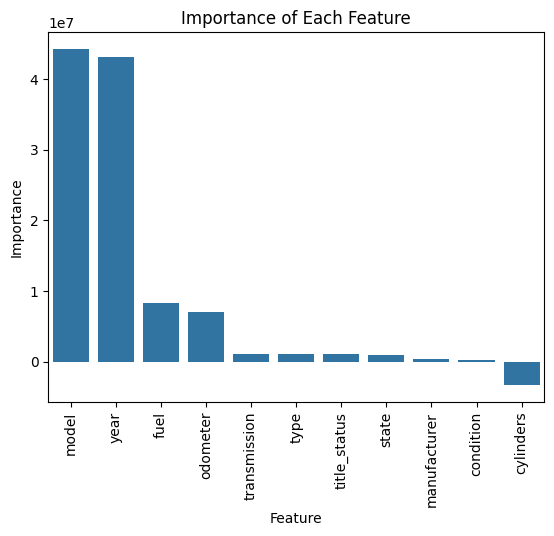

In [48]:
# Visualization of the importance of each feature vs the price
df_importances = import_df.reset_index()

sns.barplot(data = df_importances, x="index", y="Importances")

plt.xlabel("Feature")
plt.ylabel("Importance")
plt.title('Importance of Each Feature')
plt.xticks(rotation=90)  # Rotate labels by 45 degrees

#### Correlation using feature importance

[Text(0.5, 1.0, 'Correlation Heatmap')]

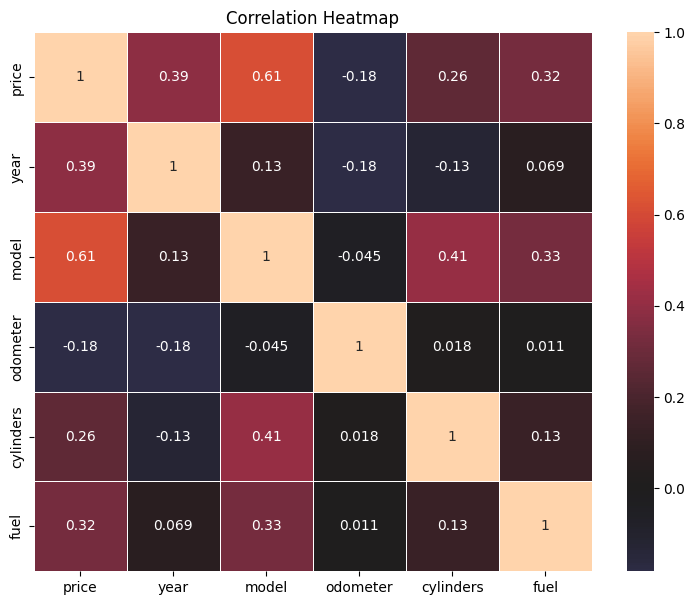

In [49]:
# Correlation using the TOP 5 features identified as most important
features_importance = ["price", "year", "model", "odometer", "cylinders" , "fuel"]
target_encoder = TargetEncoder()
df_target_encoded = target_encoder.fit_transform(df_wo_outliers[features_importance], df_wo_outliers["price"])

f, ax = plt.subplots(figsize=(9, 7))
sns.heatmap(df_target_encoded.corr(), 
    center = 0, 
    linewidth = .7, 
    annot = True
).set(title='Correlation Heatmap')

### Deployment

Now that we've settled on our models and findings, it is time to deliver the information to the client.  You should organize your work as a basic report that details your primary findings.  Keep in mind that your audience is a group of used car dealers interested in fine-tuning their inventory.

In [50]:
df= df_wo_outliers.copy()
df.sample(10)

,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,type,state
36598,9999,2015,hyundai,Sonata,like new,6,gas,146000.000000,clean,automatic,other,ca
162020,19988,2012,jeep,Wrangler,good,6,gas,139422.000000,clean,manual,other,ia
298801,18590,2013,volkswagen,Beetle,good,6,diesel,85916.000000,clean,other,other,oh
294758,4995,2009,honda,Odyssey,good,6,gas,189702.000000,clean,automatic,mini-van,oh
229146,5490,2001,hyundai,Xg300,good,6,gas,69600.000000,clean,automatic,sedan,mt
69275,27898,2018,mercedes-benz,Gla,excellent,6,gas,98729.511212,clean,automatic,SUV,ca
145666,17990,2012,volkswagen,Touareg,good,6,gas,93185.000000,clean,other,other,il
308378,14901,2013,chrysler,300,excellent,6,gas,120553.000000,clean,automatic,sedan,ok
335134,4400,2008,mercury,Grand,good,8,gas,122352.000000,clean,automatic,sedan,pa
283296,5400,2012,nissan,Sentra,excellent,4,gas,134000.000000,clean,automatic,sedan,nh


In [51]:
# Categorizing the data to improve visualizations. Using year and odometer
# - year    --> year_category: Using the descriptive categories below
# - odomter --> odomter_category: Classifying by using odometer ranges

# Vintage Car: Manufactured between 1919 and 1930. Either a “survivor” or restored in conformance to the original manufacturer specifications
# Antique Car: Manufactured 1975 or earlier (>45 years old). Either a “survivor” or restored in conformance to the original manufacturer specifications
# Classic Car: Manufactured 2000 or earlier (>20 years old)
# Modern Car : Manufactured 2000 or earlier (>10 years old)
# New Model  : Manufactured 2017 or newest (5 years old) 
min_year = min(df['year'])
max_year = max(df['year'])
year_bins = [min_year, max_year - 45 , max_year - 20 , max_year - 10, max_year - 5, max_year]
year_categories = ['Vintage', 'Antique' , 'Classic', 'Modern', 'New Model']

df['year_category'] = pd.cut(
        df['year'], 
        year_bins,  
        labels = year_categories,  
        include_lowest = True
) 

# Odometer categories
max_odometer = max(df['odometer'])
odometer_bins = [ 0, 15000 , 40000 , 70000, max_odometer]
odometer_categories = ['New', 'Low' , 'Medium', 'High']

df['odometer_category'] = pd.cut(
        df['odometer'], 
        odometer_bins,  
        labels = odometer_categories,  
        include_lowest = True
) 

display(df.sample(10))
display(year_bins)
display(odometer_bins)

,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,type,state,year_category,odometer_category
342797,7900,2012,ford,E250,excellent,8,gas,179018.0,clean,automatic,van,ri,Classic,High
321104,38990,2013,bmw,M3,good,6,gas,36299.0,clean,automatic,convertible,or,Modern,Low
424650,12950,2012,mercedes-benz,Glk350,good,6,gas,84783.0,clean,automatic,other,wi,Classic,High
144511,6975,2011,nissan,Rogue,excellent,4,gas,170098.0,clean,automatic,wagon,il,Classic,High
304022,31590,2020,mazda,Mx5,good,6,gas,2195.0,clean,other,other,ok,New Model,New
86536,48500,1969,chevrolet,Camaro,excellent,8,gas,300.0,clean,automatic,coupe,ct,Vintage,New
112273,6499,2016,hyundai,Other,excellent,6,gas,97818.0,clean,automatic,sedan,fl,Modern,High
316293,37990,2018,toyota,Tacoma,good,6,gas,62981.0,clean,automatic,pickup,or,New Model,Medium
183534,8700,2013,chrysler,Town,excellent,6,gas,103000.0,clean,automatic,mini-van,md,Modern,High
360093,14700,2010,chevrolet,Silverado,good,6,other,200392.0,clean,automatic,other,tn,Classic,High


[1900, 1977, 2002, 2012, 2017, 2022]

[0, 15000, 40000, 70000, 10000000.0]

In [52]:
#### Sales by Year Category vs Fuel

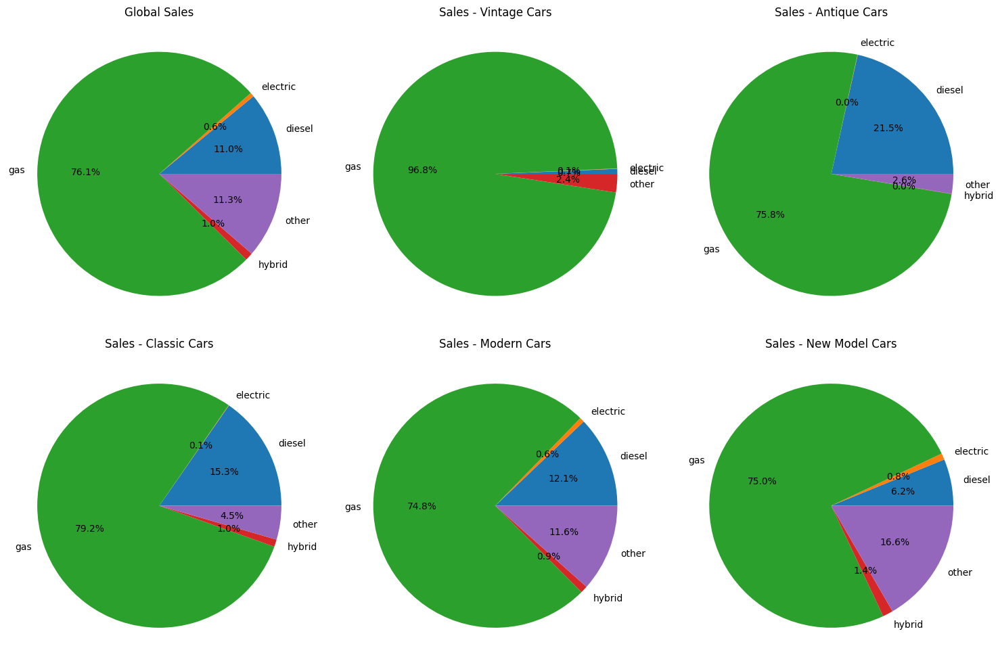

In [53]:
fig, ax = plt.subplots(2, 3, figsize = (15, 10))  # Rows, Columns, Figure size

# Original Plot
df_sales_by_fuel = df.groupby('fuel')['price'].agg(sum).reset_index()
ax[0][0].set_title('Global Sales')
ax[0][0].pie(
    df_sales_by_fuel['price'], 
	labels= df_sales_by_fuel['fuel'], 
	autopct='%1.1f%%'
)

df_sales_by_q4 = df.query('year_category == "Vintage"').groupby('fuel')['price'].agg(sum).reset_index()
ax[0][1].set_title('Sales - Vintage Cars')
ax[0][1].pie(
    df_sales_by_q4['price'], 
	labels= df_sales_by_q4['fuel'], 
	autopct='%1.1f%%'
)

df_sales_by_q3 = df.query('year_category == "Antique"').groupby('fuel')['price'].agg(sum).reset_index()
ax[0][2].set_title('Sales - Antique Cars')
ax[0][2].pie(
    df_sales_by_q3['price'], 
	labels= df_sales_by_q3['fuel'], 
	autopct='%1.1f%%'
)

df_sales_by_q2 = df.query('year_category == "Classic"').groupby('fuel')['price'].agg(sum).reset_index()
ax[1][0].set_title('Sales - Classic Cars')
ax[1][0].pie(
    df_sales_by_q2['price'], 
	labels= df_sales_by_q2['fuel'], 
	autopct='%1.1f%%'
)

df_sales_by_q2 = df.query('year_category == "Modern"').groupby('fuel')['price'].agg(sum).reset_index()
ax[1][1].set_title('Sales - Modern Cars')
ax[1][1].pie(
    df_sales_by_q2['price'], 
	labels= df_sales_by_q2['fuel'], 
	autopct='%1.1f%%'
)

df_sales_by_q2 = df.query('year_category == "New Model"').groupby('fuel')['price'].agg(sum).reset_index()
ax[1][2].set_title('Sales - New Model Cars')
ax[1][2].pie(
    df_sales_by_q2['price'], 
	labels= df_sales_by_q2['fuel'], 
	autopct='%1.1f%%'
)

plt.tight_layout()

In [54]:
#### Total sales value by manufacture year

In [55]:
px.line(
    df[['year','price']].groupby('year').agg(sum)['price'],
    title='Sales by Car Manufacture Year'
)

#### Total sales by year category vs top 10 models

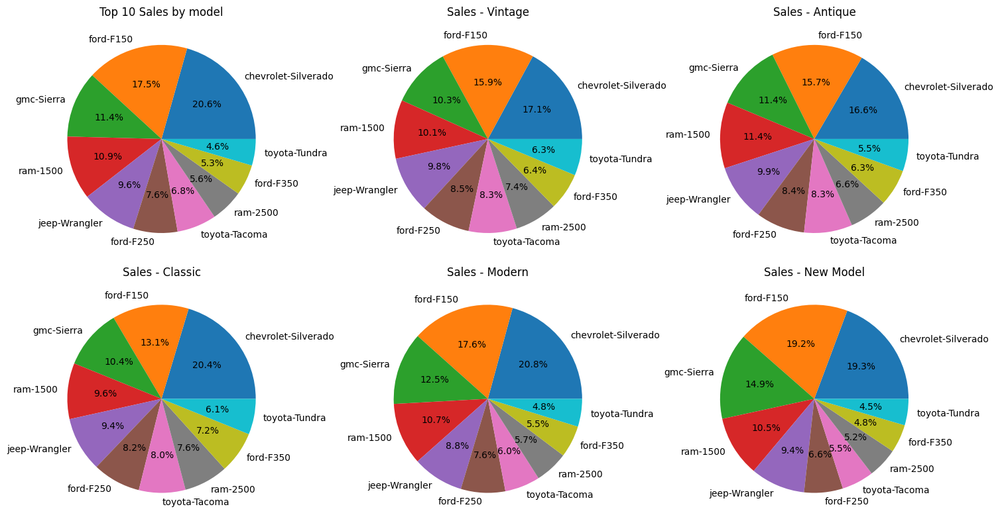

In [56]:
# Evaluating top 10 models

fig, ax = plt.subplots(2, 3, figsize = (15, 8))  # Rows, Columns, Figure size

# Original Plot
df_sales_by_model = df.groupby(['manufacturer', 'model'])['price'].agg(sum).reset_index().sort_values('price', ascending=False).iloc[0:10]
ax[0][0].set_title('Top 10 Sales by model')
ax[0][0].pie(
    df_sales_by_model['price'], 
	labels= df_sales_by_model['manufacturer'] + '-' + df_sales_by_model['model'], 
	autopct='%1.1f%%'
)

df_sales_by_q4 = df.query('year_category == "Vintage"').groupby(['manufacturer', 'model'])['price'].agg(sum).reset_index().sort_values('price', ascending=False).iloc[0:10]
ax[0][1].set_title('Sales - Vintage')
ax[0][1].pie(
    df_sales_by_q4['price'], 
	labels= df_sales_by_model['manufacturer'] + '-' + df_sales_by_model['model'], 
	autopct='%1.1f%%'
)

df_sales_by_q3 = df.query('year_category == "Antique"').groupby(['manufacturer', 'model'])['price'].agg(sum).reset_index().sort_values('price', ascending=False).iloc[0:10]
ax[0][2].set_title('Sales - Antique')
ax[0][2].pie(
    df_sales_by_q3['price'], 
	labels= df_sales_by_model['manufacturer'] + '-' + df_sales_by_model['model'], 
	autopct='%1.1f%%'
)

df_sales_by_q2 = df.query('year_category == "Classic"').groupby(['manufacturer', 'model'])['price'].agg(sum).reset_index().sort_values('price', ascending=False).iloc[0:10]
ax[1][0].set_title('Sales - Classic')
ax[1][0].pie(
    df_sales_by_q2['price'], 
	labels= df_sales_by_model['manufacturer'] + '-' + df_sales_by_model['model'], 
	autopct='%1.1f%%'
)

df_sales_by_q2 = df.query('year_category == "Modern"').groupby(['manufacturer', 'model'])['price'].agg(sum).reset_index().sort_values('price', ascending=False).iloc[0:10]
ax[1][1].set_title('Sales - Modern')
ax[1][1].pie(
    df_sales_by_q2['price'], 
	labels= df_sales_by_model['manufacturer'] + '-' + df_sales_by_model['model'], 
	autopct='%1.1f%%'
)

df_sales_by_q2 = df.query('year_category == "New Model"').groupby(['manufacturer', 'model'])['price'].agg(sum).reset_index().sort_values('price', ascending=False).iloc[0:10]
ax[1][2].set_title('Sales - New Model')
ax[1][2].pie(
    df_sales_by_q2['price'], 
	labels= df_sales_by_model['manufacturer'] + '-' + df_sales_by_model['model'], 
	autopct='%1.1f%%'
)

plt.tight_layout()

#### Sold by Top 10 Models evaluating Odometer

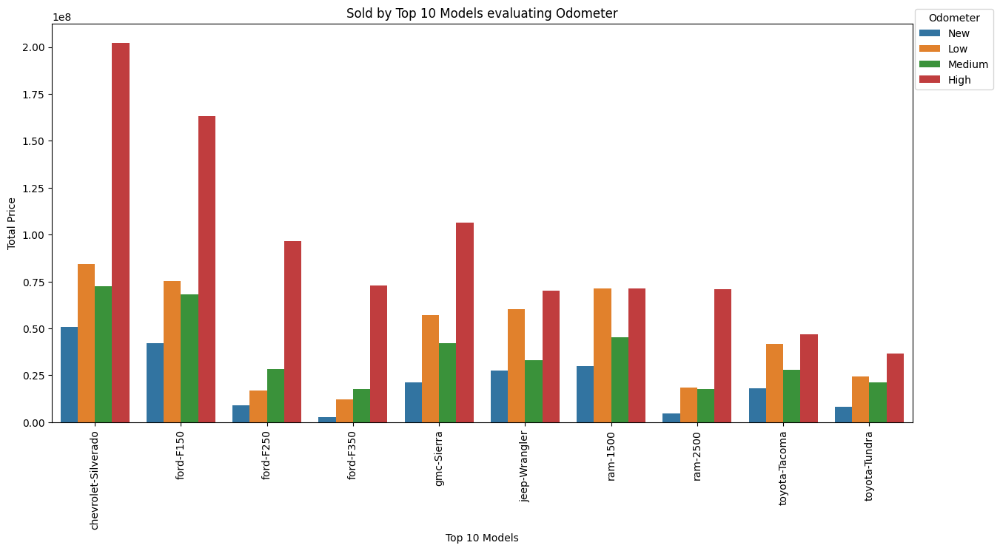

In [57]:
df_new = df.copy()
df_new['man_model'] = df_new['manufacturer'] + '-' + df_new['model']

df_topmodels = df.groupby(['manufacturer', 'model'])['price'].agg(sum).reset_index().sort_values('price', ascending=False).iloc[0:10]
df_topmodels['man_model'] = df_topmodels['manufacturer'] + '-' + df_topmodels['model']

top_models = df_topmodels['man_model'].unique()

df_data = df_new.query('man_model in(@top_models)').groupby(['man_model', 'odometer_category'])['price'].sum().reset_index()


plt.figure(figsize = (15, 7))
sns.barplot(df_data, x = "man_model", y="price", hue = "odometer_category").set(title = "Sold by Top 10 Models evaluating Odometer")
plt.xticks(rotation = 90)
plt.xlabel('Top 10 Models')
plt.ylabel('Total Price')
plt.legend(bbox_to_anchor=(1.1, 1.05), title="Odometer")
plt.show()

In [58]:
#### Evaluating 2018 (Year with most sales) and the distribution of top models & Odometer

,man_model,odometer_category,price
0,alfa-romeo-Romeo,New,3536626
1,alfa-romeo-Romeo,Low,11804356
2,alfa-romeo-Romeo,Medium,764616
3,alfa-romeo-Romeo,High,716492
4,audi-S5,New,0
5,audi-S5,Low,4388518
6,audi-S5,Medium,9578297
7,audi-S5,High,251216
8,chevrolet-Silverado,New,3516612
9,chevrolet-Silverado,Low,10743544


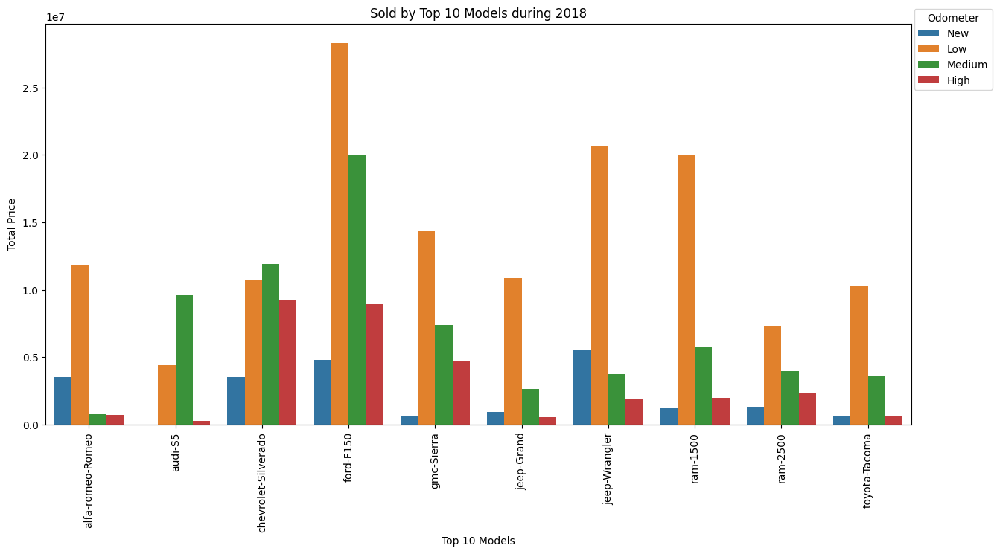

In [59]:
df_new = df.copy()
df_new = df_new.query('year == 2018')
df_new['man_model'] = df_new['manufacturer'] + '-' + df_new['model']

df_topmodels = df_new.groupby(['man_model'])['price'].agg(sum).reset_index().sort_values('price', ascending=False).iloc[0:10]
top_models = df_topmodels['man_model'].unique()
df_data = df_new.query('man_model in(@top_models)').groupby(['man_model', 'odometer_category'])['price'].sum().reset_index()

display(df_data)

plt.figure(figsize = (15, 7))
sns.barplot(df_data, x = "man_model", y="price", hue = "odometer_category").set(title = "Sold by Top 10 Models during 2018")
plt.xticks(rotation = 90)
plt.xlabel('Top 10 Models')
plt.ylabel('Total Price')
plt.legend(bbox_to_anchor=(1.1, 1.05), title="Odometer")
plt.show()


#### Sales 2018 by model

([<matplotlib.patches.Wedge at 0x16adf0690>,
 [Text(0.8077005459977912, 0.7467394646025279, 'ford-F150'),
  Text(-0.3743492780391608, 1.0343416350662673, 'chevrolet-Silverado'),
  Text(-1.006035493375387, 0.4448511954226287, 'jeep-Wrangler'),
  Text(-1.0462619755109777, -0.33961136406172704, 'ram-1500'),
  Text(-0.6054973950603282, -0.9183533658538836, 'gmc-Sierra'),
  Text(-0.060781440178009655, -1.0983194510386707, 'alfa-romeo-Romeo'),
  Text(0.3549130648031609, -1.0411708392151728, 'toyota-Tacoma'),
  Text(0.7001630458379106, -0.8483936051403146, 'jeep-Grand'),
  Text(0.9538290675087476, -0.547914327222234, 'ram-2500'),
  Text(1.0839695725919387, -0.18710950188285402, 'audi-S5')],
 [Text(0.4405639341806133, 0.40731243523774247, '23.8%'),
  Text(-0.2041905152940877, 0.564186346399782, '13.5%'),
  Text(-0.5487466327502111, 0.24264610659416108, '12.1%'),
  Text(-0.570688350278715, -0.18524256221548746, '11.1%'),
  Text(-0.3302713063965426, -0.5009200177384819, '10.4%'),
  Text(-0.03315

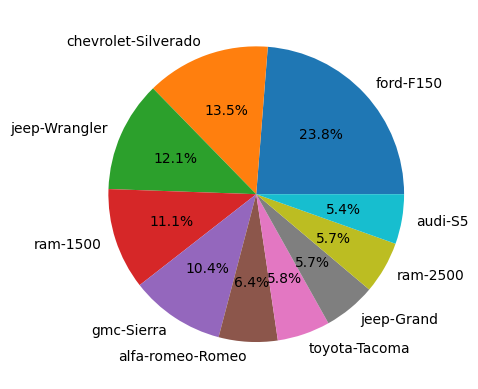

In [60]:
df_2018_top = df_data.groupby('man_model')['price'].agg(sum).reset_index().sort_values('price', ascending=False)

plt.pie(
    df_2018_top['price'], 
	labels= df_2018_top['man_model'], 
	autopct='%1.1f%%'
)